# HVM Neural Reconstruction — Condition Comparison

Tests image reconstruction across four conditions on the **test split** (90 stimuli, 9 per category).
MultiHead encoder loaded from `cache/best_hvm_multihead_config.json` (saved by `sweep_hvm_multihead_results.ipynb`).

| # | Condition | T5 | CLIP pooled | SigLIP (IP-adapter) |
|---|-----------|-----|-------------|---------------------|
| 1 | **control** | null | null | none |
| 2 | **text (GT CLIP-short)** | null | GT short-caption CLIP | none |
| 3 | **neural pred** | null | predicted CLIP-short | predicted SigLIP |
| 4 | **GT emb** | null | GT short-caption CLIP | GT SigLIP |

In [1]:
import sys, json
from pathlib import Path

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from tqdm import tqdm

sys.path.insert(0, '.')
from config_const import (
    CACHE_DIR, SEED,
    HVM_STIM_DIR, HVM_N_STIMULI, HVM_N_VAR, HVM_N_CAT, HVM_CATEGORIES,
    HVM_SIGLIP_EMBEDDINGS_PATH, HVM_CLIP_EMBEDS_PATH, HVM_BLIP2_CAPTIONS_PATH,
    SIGLIP_DIM,
)
from data_utils.hvm_loader import _category_stratified_split, _load_hvm_neural
from encoders import MultiHeadTransformer
from eval.metrics import two_afc_identification
from generation.flux_instantx import load_pipeline, generate_img2img
from get_device import get_device

## 1. Data — split, captions, ground-truth embeddings

In [2]:
train_idx, val_idx, test_idx = _category_stratified_split(SEED)
print(f"train: {len(train_idx)}  val: {len(val_idx)}  test: {len(test_idx)}")

with open(HVM_BLIP2_CAPTIONS_PATH) as f:
    captions = {int(k): v for k, v in json.load(f).items()}
print(f"Captions loaded: {len(captions)}")

siglip_gt = torch.load(HVM_SIGLIP_EMBEDDINGS_PATH, weights_only=True)  # (450, 1152)
clip_short = torch.load(HVM_CLIP_EMBEDS_PATH, weights_only=True)        # (450, 768)
print(f"GT SigLIP: {tuple(siglip_gt.shape)}  CLIP short: {tuple(clip_short.shape)}")

cat_indices = torch.arange(HVM_N_STIMULI) // HVM_N_VAR  # (450,) — 0..9


def load_stimulus(global_idx: int, size: int = 512) -> Image.Image:
    cat = HVM_CATEGORIES[global_idx // HVM_N_VAR]
    var = global_idx % HVM_N_VAR
    return Image.open(HVM_STIM_DIR / cat / f"{var:02d}.png").convert("RGB").resize(
        (size, size), Image.LANCZOS
    )

train: 270  val: 90  test: 90
Captions loaded: 450
GT SigLIP: (450, 1152)  CLIP short: (450, 768)


## 2. Load best multihead encoder

In [3]:
cfg_path = CACHE_DIR / 'best_hvm_multihead_config.json'
cfg = json.loads(cfg_path.read_text())
print(f"val_mean_cos:  {cfg['val_mean_cos']:.4f}")
print(f"val_mean_2afc: {cfg['val_mean_2afc']:.4f}")
print(f"d_model={cfg['d_model']}  n_layers={cfg['n_layers']}  shared_dim={cfg['shared_dim']}  nce_weight={cfg['nce_weight']}")
print(f"checkpoint:    {cfg['checkpoint']}")

val_mean_cos:  0.9216
val_mean_2afc: 0.9341
d_model=64  n_layers=2  shared_dim=512  nce_weight=0.1
checkpoint:    /home/yy3658/NeurObjectGen/checkpoints/multihead/hvm_cat/d64_nh4_nl2_sd512_do0.1_lr0.0003_wd0.01_tn0.02_in0.05_nd0.1_bs128_ws1.0_wc1.0_uw0.1_nw0.1_nt0.07/best.pt


In [4]:
# Load neural data
rsp = _load_hvm_neural()           # (450, n_neurons, n_time)
_, n_neurons, n_time = rsp.shape
print(f"Neural: {n_neurons} neurons × {n_time} time bins")

model = MultiHeadTransformer(
    n_neurons=n_neurons,
    d_model=int(cfg['d_model']),
    n_heads=int(cfg['n_heads']),
    n_layers=int(cfg['n_layers']),
    shared_dim=int(cfg['shared_dim']),
    dropout=float(cfg['dropout']),
    n_categories=HVM_N_CAT,
)

ckpt = torch.load(cfg['checkpoint'], weights_only=False, map_location='cpu')
model.load_state_dict(ckpt['model_state'])
model.eval()
print(f"Loaded checkpoint (epoch {ckpt['epoch']})")

Loading HVM sessions:   0%|          | 0/5 [00:00<?, ?it/s]

Loading HVM sessions: 100%|██████████| 10/10 [00:42<00:00,  4.22s/it]


Neural: 2330 neurons × 25 time bins
Loaded checkpoint (epoch 135)


/home/yy3658/miniconda3/envs/objGen/lib/python3.12/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


In [5]:
neural_tensor = torch.from_numpy(rsp).float()  # (450, n_neurons, n_time)
cat_indices   = torch.arange(HVM_N_STIMULI) // HVM_N_VAR  # (450,) — 0..9


@torch.no_grad()
def predict_all() -> tuple[torch.Tensor, torch.Tensor]:
    """Return (siglip_preds, clip_short_preds) each (450, D)."""
    sigs, clips = [], []
    for i in range(HVM_N_STIMULI):
        x   = neural_tensor[i:i+1].permute(0, 2, 1)  # (1, T, N)
        cat = cat_indices[i:i+1]
        out = model(x, cat)
        sigs.append(out['siglip'].cpu())
        clips.append(out['clip'].cpu())
    return torch.cat(sigs), torch.cat(clips)


neural_pred_sig, neural_pred_clip = predict_all()  # (450, 1152), (450, 768)

# Load GT embeddings for comparison
siglip_gt  = torch.load(HVM_SIGLIP_EMBEDDINGS_PATH, weights_only=True)   # (450, 1152)
clip_gt    = F.normalize(torch.load(HVM_CLIP_EMBEDS_PATH, weights_only=True), dim=-1)  # (450, 768)

train_idx, val_idx, test_idx = _category_stratified_split(SEED)

gt_sig_test   = F.normalize(siglip_gt[test_idx], dim=-1)
pred_sig_test = neural_pred_sig[test_idx]
gt_clip_test  = clip_gt[test_idx]
pred_clip_test = neural_pred_clip[test_idx]

print(f"SigLIP  — Test 2-AFC: {two_afc_identification(pred_sig_test, gt_sig_test):.4f}  "
      f"cos: {F.cosine_similarity(pred_sig_test, gt_sig_test, dim=-1).mean():.4f}")
print(f"CLIP-sh — Test 2-AFC: {two_afc_identification(pred_clip_test, gt_clip_test):.4f}  "
      f"cos: {F.cosine_similarity(pred_clip_test, gt_clip_test, dim=-1).mean():.4f}")

SigLIP  — Test 2-AFC: 0.9633  cos: 0.8602
CLIP-sh — Test 2-AFC: 0.9101  cos: 0.9850


## 3. Load FLUX + InstantX IP-Adapter

In [6]:
device = get_device()
torch.cuda.empty_cache()
pipe, image_proj = load_pipeline(device=device, default_scale=1.0)
print("Pipeline ready")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Pipeline ready


In [7]:
# Pre-encode T5 + CLIP embeddings for all 10 HVM category names (runs once)
from generation.flux_instantx import encode_text_embeds
from generation.aperture import load_hvm_packed_aperture_mask

IMAGE_SIZE = 512

cat_clip_embeds, cat_t5_embeds = encode_text_embeds(pipe, list(HVM_CATEGORIES))
# cat_clip_embeds: (10, 768)   cat_t5_embeds: (10, seq, 4096)
print(f"Category text embeds: CLIP {tuple(cat_clip_embeds.shape)}  T5 {tuple(cat_t5_embeds.shape)}")

# Pre-build HVM aperture mask (circle r=0.491, fixation sq=0.036 of image)
hvm_aperture = load_hvm_packed_aperture_mask(image_size=IMAGE_SIZE, device='cpu', dtype=torch.bfloat16)
print(f"HVM aperture mask: {tuple(hvm_aperture.shape)}")

def cat_text_embeds(stim_idx: int):
    """Return (prompt_embeds, pooled_prompt_embeds) for the category of stim_idx."""
    cat_i = int(stim_idx) // HVM_N_VAR
    return cat_t5_embeds[cat_i:cat_i+1], cat_clip_embeds[cat_i:cat_i+1]

Category text embeds: CLIP (10, 768)  T5 (10, 512, 4096)
HVM aperture mask: (1, 1024, 1)


## 4. Generate: four conditions across N_SHOW test stimuli

`init_image` = ground-truth stimulus at 512 × 512.

- `control`     — null T5, null CLIP, no SigLIP IP-adapter
- `text`        — **T5 + CLIP** of category name, no SigLIP
- `neural_pred` — **T5 + CLIP** of category name + **predicted** CLIP-short pooled + **predicted** SigLIP (IP-adapter)
- `gt_emb`      — **T5 + CLIP** of category name + **GT** SigLIP (IP-adapter, upper bound)

In [20]:
N_SHOW     = 8
STRENGTH   = 0.55
IP_SCALE   = 1
NUM_STEPS  = 20
IMAGE_SIZE = 512

In [21]:
zero_siglip  = torch.zeros(SIGLIP_DIM)
# Encode empty string to get null text embeddings (non-zero due to positional/layer norm)
null_clip, null_t5 = encode_text_embeds(pipe, [''])
zero_clip = null_clip   # (1, 768)
zero_t5   = null_t5    # (1, seq, 4096)

# Load stimuli helper
def load_stimulus(global_idx: int, size: int = 512) -> Image.Image:
    cat = HVM_CATEGORIES[global_idx // HVM_N_VAR]
    var = global_idx % HVM_N_VAR
    return Image.open(HVM_STIM_DIR / cat / f"{var:02d}.png").convert("RGB").resize(
        (size, size), Image.LANCZOS
    )

with open(HVM_BLIP2_CAPTIONS_PATH) as f:
    captions = {int(k): v for k, v in json.load(f).items()}

results = []

for i, stim_idx in enumerate(tqdm(test_idx[:N_SHOW], desc="Generating")):
    stim_idx = int(stim_idx)
    orig     = load_stimulus(stim_idx, IMAGE_SIZE)
    cat_name = HVM_CATEGORIES[stim_idx // HVM_N_VAR]

    sig_pred  = neural_pred_sig[stim_idx]
    sig_gt    = siglip_gt[stim_idx]
    clip_pred = neural_pred_clip[stim_idx].unsqueeze(0)  # (1, 768)
    t5_cat, clip_cat = cat_text_embeds(stim_idx)         # (1, seq, 4096), (1, 768)

    shared = dict(
        height=IMAGE_SIZE, width=IMAGE_SIZE,
        num_inference_steps=NUM_STEPS,
        guidance_scale=7.5,
        strength=STRENGTH,
        seed=42,
        aperture_mask=hvm_aperture,
        show_progress=False,
    )

    # control: null everything
    gen_control = generate_img2img(
        pipe, image_proj, orig, zero_siglip,
        ip_adapter_scale=0.0,
        prompt='',
        **shared)

    # text: T5 of category name only (CLIP pooled zeroed out)
    gen_text = generate_img2img(
        pipe, image_proj, orig, zero_siglip,
        ip_adapter_scale=0.0,
        prompt_embeds=zero_t5,
        pooled_prompt_embeds=clip_cat,
        **shared)

    # neural_pred: category T5 + predicted CLIP-short pooled + predicted SigLIP IP-adapter
    gen_neural = generate_img2img(
        pipe, image_proj, orig, sig_pred,
        ip_adapter_scale=IP_SCALE,
        prompt_embeds=zero_t5,
        pooled_prompt_embeds=clip_pred,
        **shared)

    # GT upper bound: category T5 + GT CLIP pooled + GT SigLIP IP-adapter
    gen_gt = generate_img2img(
        pipe, image_proj, orig, sig_gt,
        ip_adapter_scale=IP_SCALE,
        prompt_embeds=zero_t5,
        pooled_prompt_embeds=clip_cat,
        **shared)

    results.append(dict(
        stim_idx=stim_idx,
        cat=cat_name,
        orig=orig,
        control=gen_control,
        text=gen_text,
        neural_pred=gen_neural,
        gt_emb=gen_gt,
    ))

Generating: 100%|██████████| 8/8 [02:16<00:00, 17.01s/it]


In [22]:
def plot_group(results, cols, col_labels, title):
    n = len(results)
    fig, axes = plt.subplots(n, len(cols), figsize=(len(cols) * 2.5, n * 2.8))
    if n == 1:
        axes = axes[None, :]
    for ax in axes.flat:
        ax.axis("off")
    for j, lbl in enumerate(col_labels):
        axes[0, j].set_title(lbl, fontsize=9, fontweight="bold")
    for i, r in enumerate(results):
        for j, col in enumerate(cols):
            axes[i, j].imshow(r[col])
        axes[i, 0].set_ylabel(f"{r['cat']} [{r['stim_idx']}]", fontsize=7)
    plt.suptitle(title, fontsize=10, y=1.01)
    plt.tight_layout()
    plt.show()

## 5. Plot: all four conditions

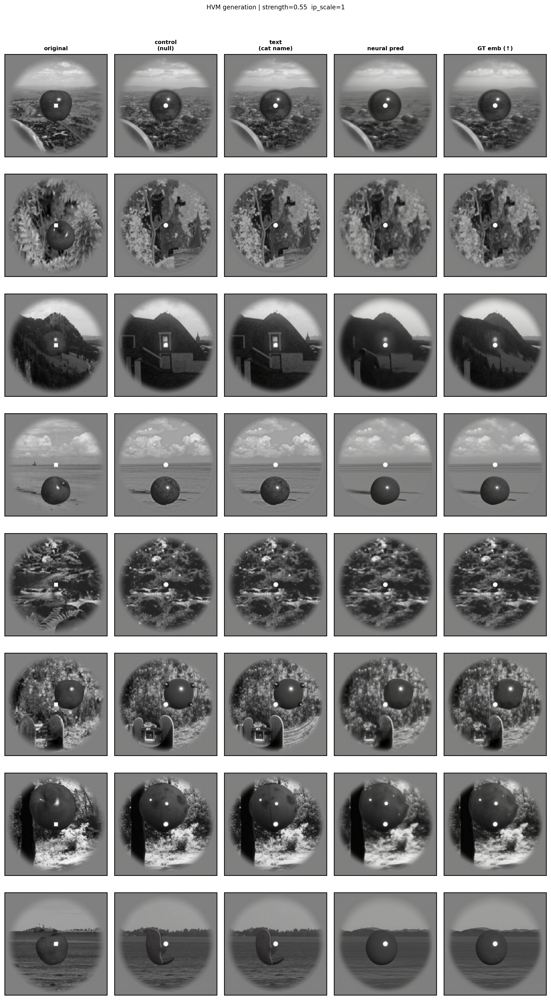

In [23]:
plot_group(
    results,
    cols=["orig", "control", "text", "neural_pred", "gt_emb"],
    col_labels=["original", "control\n(null)", "text\n(cat name)", "neural pred", "GT emb (↑)"],
    title=f"HVM generation | strength={STRENGTH}  ip_scale={IP_SCALE}",
)

## 6. Per-category: one example per HVM category

Per-category:   0%|          | 0/10 [00:00<?, ?it/s]

Per-category: 100%|██████████| 10/10 [02:50<00:00, 17.00s/it]


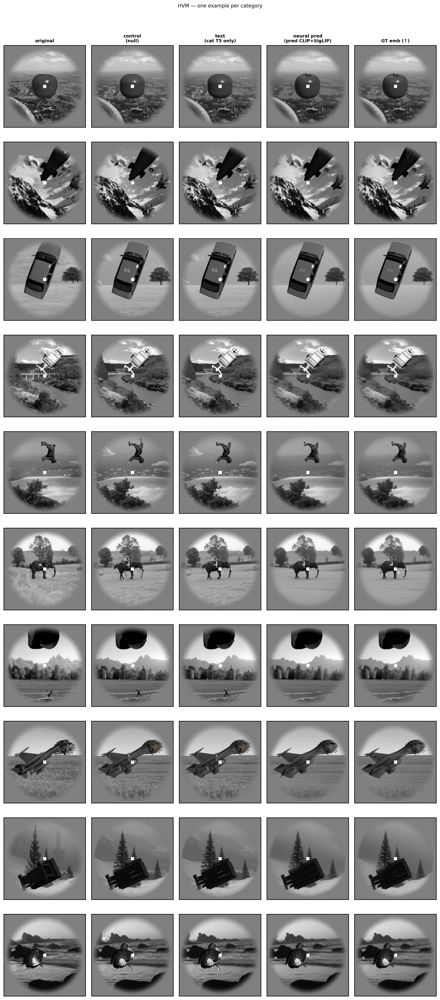

In [24]:
# Pick first test stimulus from each category
cat_to_stim = {}
for stim_idx in test_idx:
    cat = HVM_CATEGORIES[int(stim_idx) // HVM_N_VAR]
    if cat not in cat_to_stim:
        cat_to_stim[cat] = int(stim_idx)
    if len(cat_to_stim) == HVM_N_CAT:
        break

cat_results = []
for cat_name, stim_idx in tqdm(cat_to_stim.items(), desc="Per-category"):
    orig = load_stimulus(stim_idx, IMAGE_SIZE)
    t5_cat, clip_cat = cat_text_embeds(stim_idx)
    shared = dict(
        height=IMAGE_SIZE, width=IMAGE_SIZE,
        num_inference_steps=NUM_STEPS, guidance_scale=3.5,
        strength=STRENGTH, seed=0,
        aperture_mask=hvm_aperture, show_progress=False,
    )
    gen_control = generate_img2img(
        pipe, image_proj, orig, zero_siglip,
        ip_adapter_scale=0.0, prompt='', **shared)
    gen_text = generate_img2img(
        pipe, image_proj, orig, zero_siglip,
        ip_adapter_scale=0.0,
        prompt_embeds=zero_t5,
        pooled_prompt_embeds=clip_cat,
        **shared)
    gen_neural = generate_img2img(
        pipe, image_proj, orig, neural_pred_sig[stim_idx],
        ip_adapter_scale=IP_SCALE,
        prompt_embeds=zero_t5,
        pooled_prompt_embeds=neural_pred_clip[stim_idx].unsqueeze(0),
        **shared)
    gen_gt = generate_img2img(
        pipe, image_proj, orig, siglip_gt[stim_idx],
        ip_adapter_scale=IP_SCALE,
        prompt_embeds=zero_t5, pooled_prompt_embeds=clip_cat, **shared)
    cat_results.append(dict(
        stim_idx=stim_idx, cat=cat_name,
        orig=orig, control=gen_control, text=gen_text,
        neural_pred=gen_neural, gt_emb=gen_gt,
    ))

plot_group(
    cat_results,
    cols=["orig", "control", "text", "neural_pred", "gt_emb"],
    col_labels=["original", "control\n(null)", "text\n(cat T5 only)", "neural pred\n(pred CLIP+SigLIP)", "GT emb (↑)"],
    title="HVM — one example per category",
)

In [ ]:
OUT_DIR = Path('outputs/generate_hvm')
OUT_DIR.mkdir(parents=True, exist_ok=True)

SAVE_LABELS = ['Original', 'Control\n(null)', 'Text\n(cat CLIP)', 'Neural pred\n(pred CLIP+SigLIP)', 'GT emb (↑)']
LABEL_H = 36
try:
    _font = ImageFont.truetype('/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf', 14)
except Exception:
    _font = ImageFont.load_default()


def add_labels(images, labels, label_h=LABEL_H):
    w, h = images[0].size
    canvas = Image.new('RGB', (w * len(images), h + label_h), color=(30, 30, 30))
    draw = ImageDraw.Draw(canvas)
    for j, (img, lbl) in enumerate(zip(images, labels)):
        canvas.paste(img, (w * j, label_h))
        lines = lbl.split('\n')
        line_h = label_h // max(len(lines), 1)
        for li, line in enumerate(lines):
            bbox = draw.textbbox((0, 0), line, font=_font)
            tw = bbox[2] - bbox[0]
            draw.text((w * j + (w - tw) // 2, li * line_h + 2), line, font=_font, fill=(255, 255, 255))
    return canvas


for i, stim_idx in enumerate(tqdm((int(s) for s in test_idx), desc='Saving', total=len(test_idx))):
    orig    = load_stimulus(stim_idx, IMAGE_SIZE)
    t5_stim, clip_stim = cat_text_embeds(stim_idx)
    shared = dict(
        height=IMAGE_SIZE, width=IMAGE_SIZE,
        num_inference_steps=NUM_STEPS, guidance_scale=3.5,
        strength=STRENGTH, seed=i,
        aperture_mask=hvm_aperture, show_progress=False,
    )
    gen_control = generate_img2img(
        pipe, image_proj, orig, zero_siglip,
        ip_adapter_scale=0.0, prompt='', **shared)
    gen_text = generate_img2img(
        pipe, image_proj, orig, zero_siglip,
        ip_adapter_scale=0.0,
        prompt_embeds=zero_t5, pooled_prompt_embeds=clip_stim, **shared)
    gen_neural = generate_img2img(
        pipe, image_proj, orig, neural_pred_sig[stim_idx],
        ip_adapter_scale=IP_SCALE,
        prompt_embeds=zero_t5,
        pooled_prompt_embeds=neural_pred_clip[stim_idx].unsqueeze(0), **shared)
    gen_gt = generate_img2img(
        pipe, image_proj, orig, siglip_gt[stim_idx],
        ip_adapter_scale=IP_SCALE,
        prompt_embeds=zero_t5, pooled_prompt_embeds=clip_stim, **shared)
    combined = add_labels(
        [orig, gen_control, gen_text, gen_neural, gen_gt],
        SAVE_LABELS,
    )
    combined.save(OUT_DIR / f'stim{stim_idx:04d}.png')

print(f'Saved {len(test_idx)} images to {OUT_DIR}')

Saving:  49%|████▉     | 44/90 [12:36<13:10, 17.18s/it]